In [ ]:
import numpy as np
import cupy as cp
import matplotlib.pyplot as plt

In [ ]:
np.random.seed(100)

In [ ]:
redDots = np.random.rand(1000,2)*2.5 + [1,1]

In [ ]:
blueDots = np.random.rand(1000,2)*2.5 + [ -1,-1]

In [ ]:
x = np.vstack([redDots, blueDots])

In [ ]:
x

array([[ 2.35851235,  1.69592346],
       [ 2.06129398,  3.11194033],
       [ 1.01179714,  1.3039228 ],
       ...,
       [ 0.43641919, -0.80419808],
       [ 1.11825311,  0.98322207],
       [-0.12920236,  1.41541743]])

In [ ]:
y= np.array([1]*1000 + [0]*1000).reshape(-1,1)

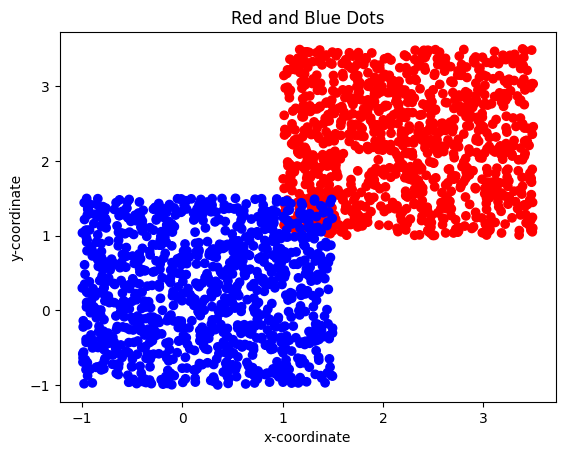

In [ ]:
plt.scatter(x[:, 0], x[:, 1], c=y.flatten(), cmap='bwr')  # Red for 1, blue for 0
plt.title("Red and Blue Dots")
plt.xlabel("x-coordinate")
plt.ylabel("y-coordinate")
plt.show()

In [ ]:
w1 = np.random.randn(2,3)*0.1

In [ ]:
w1

array([[-0.02362306, -0.01923739,  0.06355858],
       [ 0.13387525,  0.17339144, -0.02823033]])

In [ ]:
dd = np.matmul(x,w1)

In [ ]:
b1 = np.zeros((1,3))

In [ ]:
w2 = np.random.randn(3,1)*0.1
b2 = np.zeros((1,1))

**MODEL BUILDING**

In [ ]:
def reLu(z):
  return np.maximum(0,z)

def sigmoid(z):
  return 1/(1+np.exp(-z))

In [ ]:
def forwardPass(x,w1,b1,w2,b2):
  z1 = x@w1 + b1
  a1 = reLu(z1)
  z2 = a1@w2 +b2
  a2 = sigmoid(z2)
  return z1,a1,z2,a2

In [ ]:
Z1, A1, Z2, A2 = forwardPass(x, w1, b1, w2, b2)

In [ ]:
A2[:5]

array([[0.50084561],
       [0.50111947],
       [0.50049731],
       [0.50122581],
       [0.50082489]])

In [ ]:
def lossFunction(y,a2):
  m = y.shape[0]
  epsilon = 1e-15
  loss = -np.mean(y * np.log(A2 + epsilon) + (1 - y) * np.log(1 - A2 + epsilon))
  return loss

In [ ]:
def backward(X, y, Z1, A1, Z2, A2, W2):
    m = X.shape[0]  # 200

    # Output layer slopes
    dZ2 = A2 - y  # Shape: 200, 1
    dW2 = (A1.T @ dZ2) / m  # Shape: 3, 1
    db2 = np.sum(dZ2, axis=0, keepdims=True) / m  # Shape: (1, 1)

    # Hidden layer slopes
    dA1 = dZ2 @ W2.T  # Shape: 200, 3
    dZ1 = dA1 * (Z1 > 0)  # ReLU slope: 1 if Z1 > 0, else 0
    dW1 = (X.T @ dZ1) / m  # Shape: 2, 3
    db1 = np.sum(dZ1, axis=0, keepdims=True) / m  # Shape: 1, 3

    return dW1, db1, dW2, db2

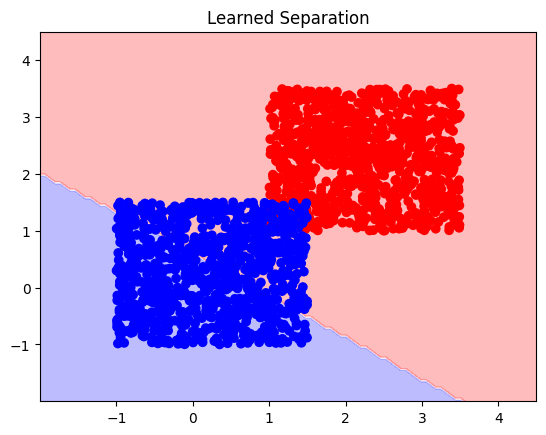

Epoch 0, Loss: 0.4900


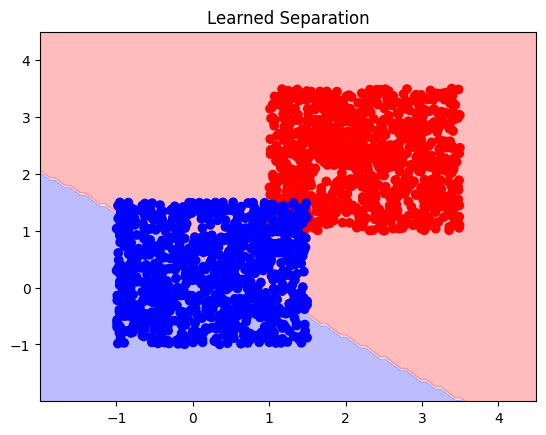

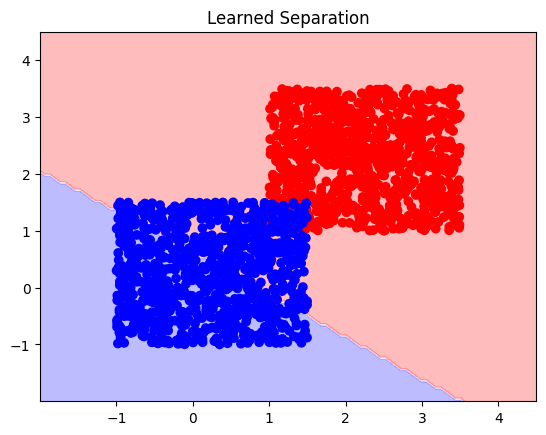

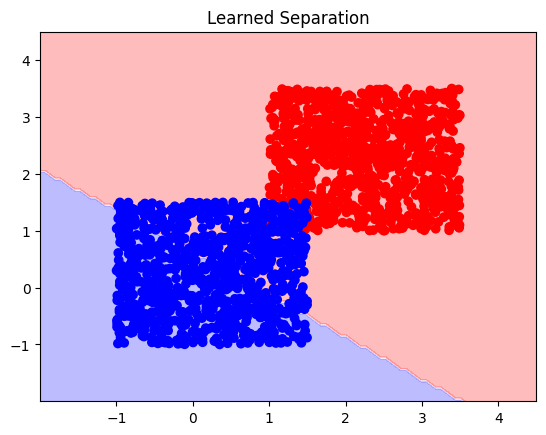

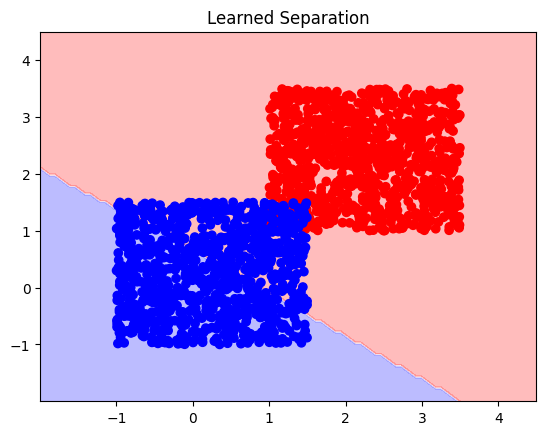

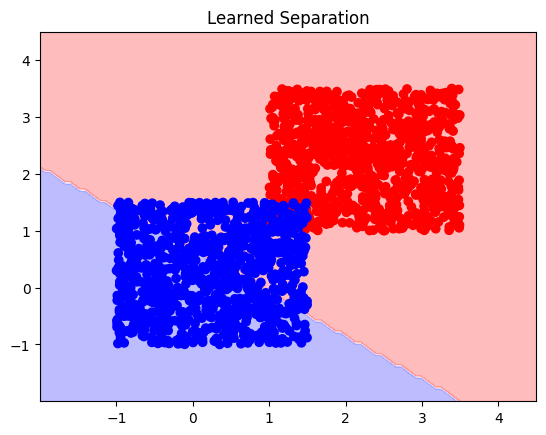

...

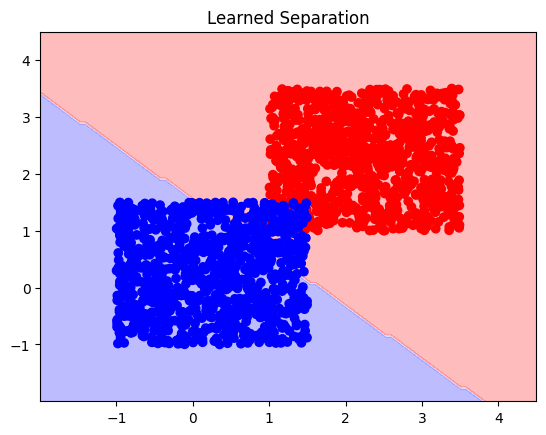

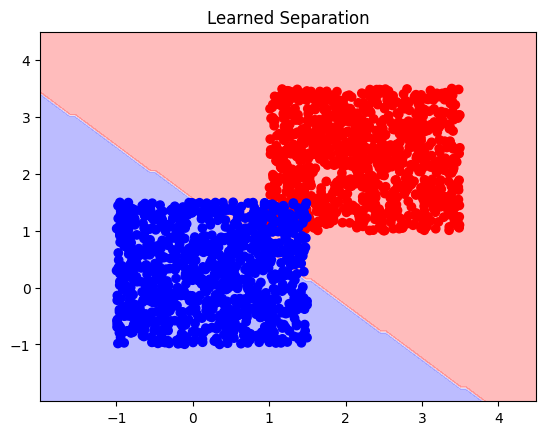

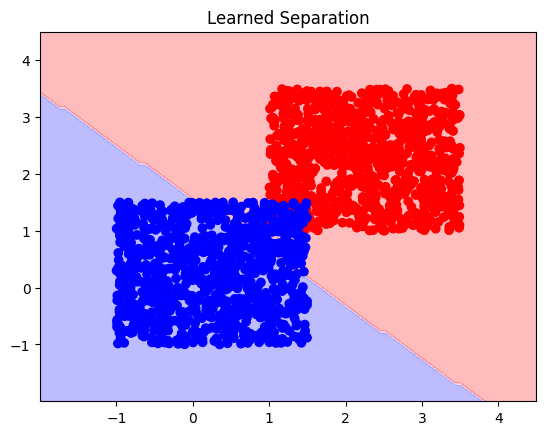

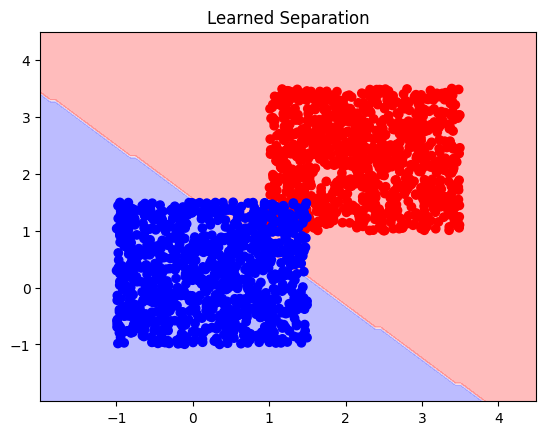

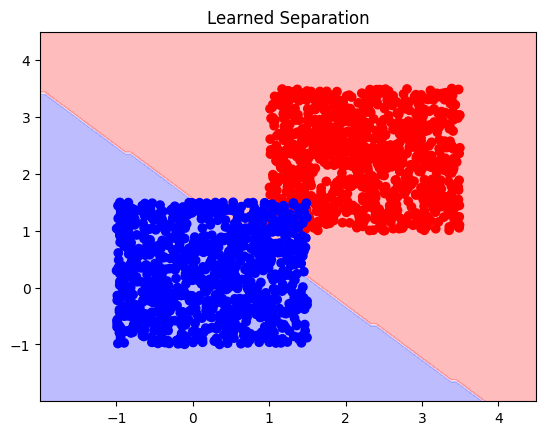

Epoch 100, Loss: 0.3065


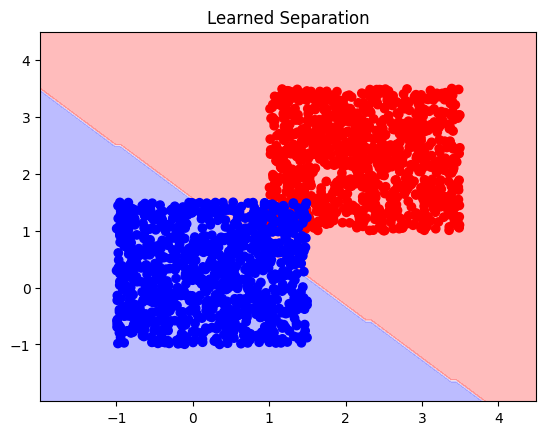

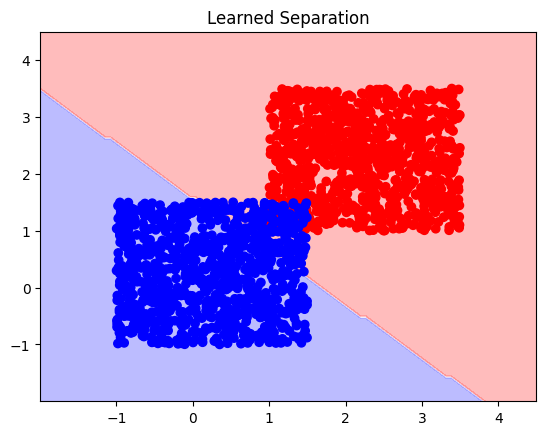

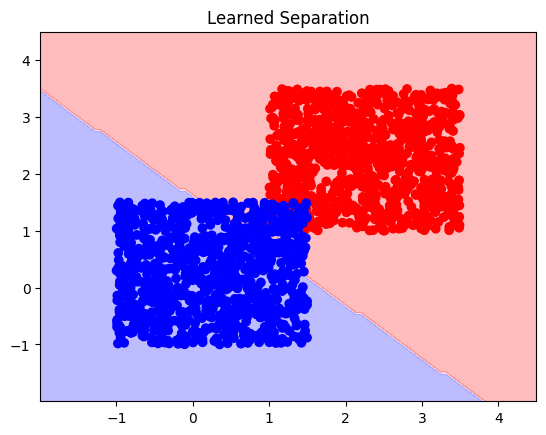

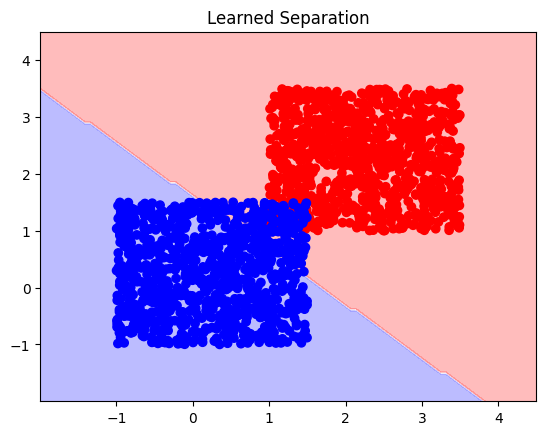

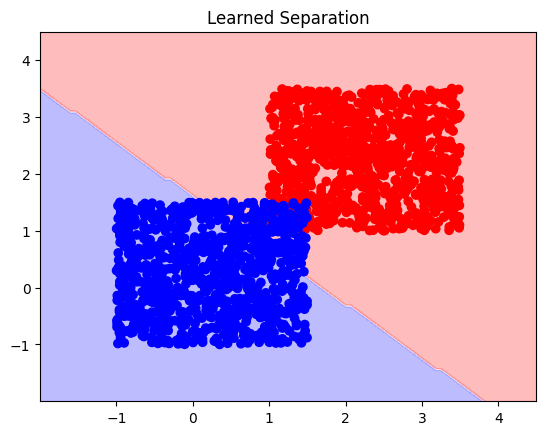

...

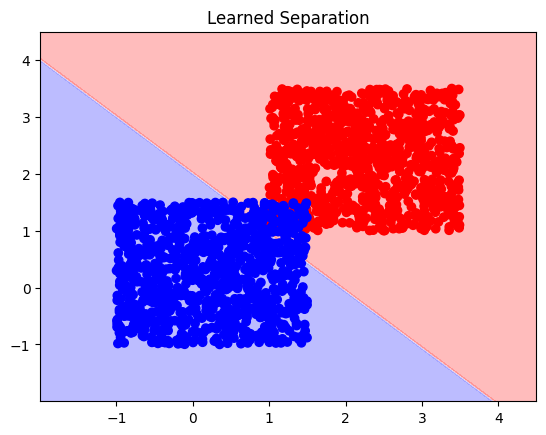

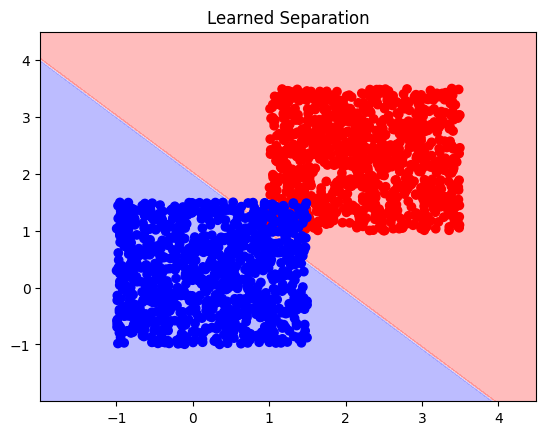

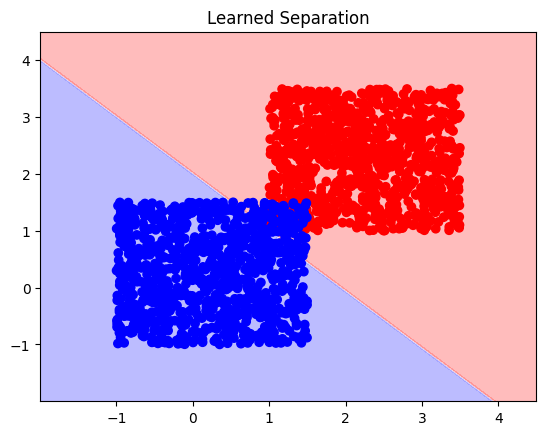

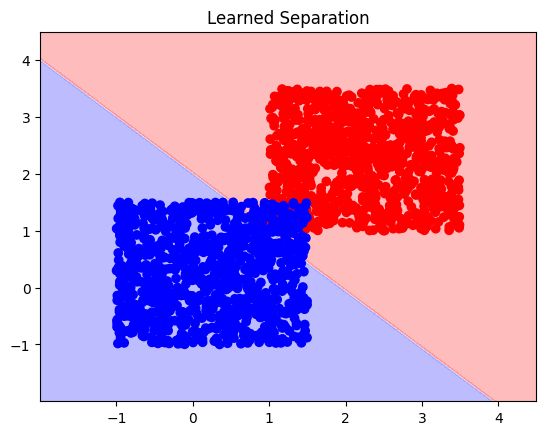

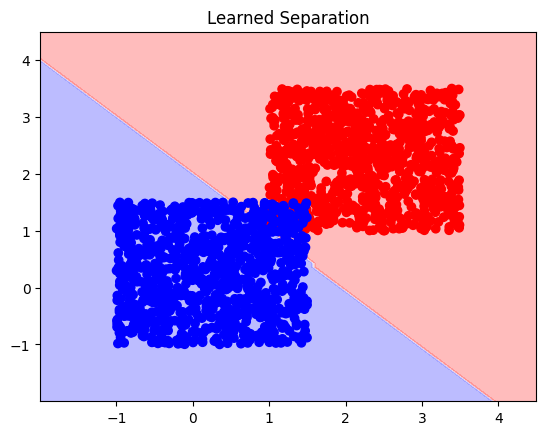

Epoch 200, Loss: 0.2180


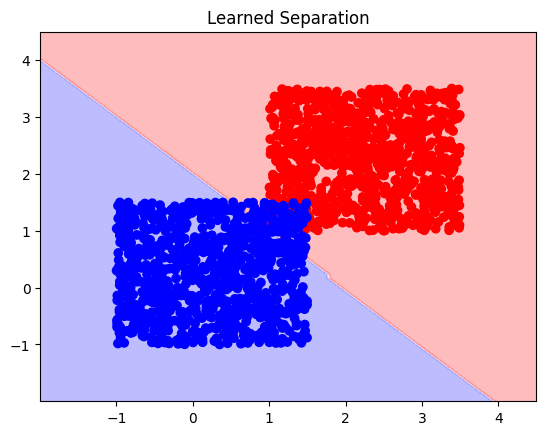

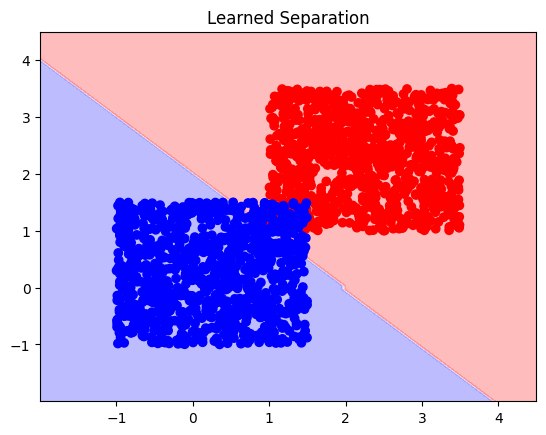

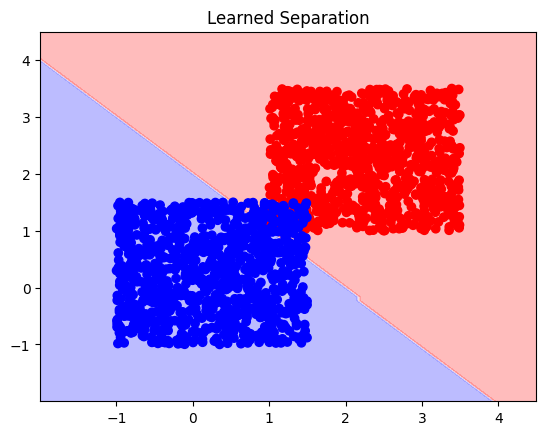

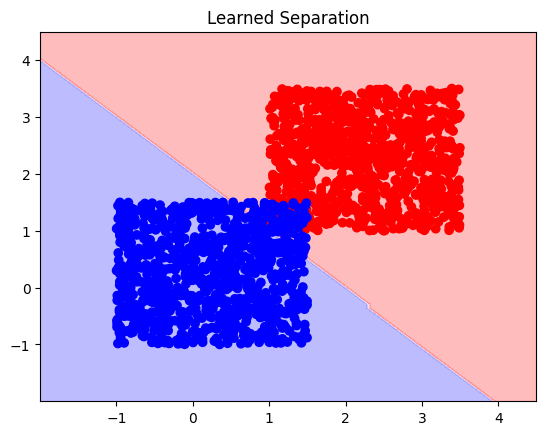

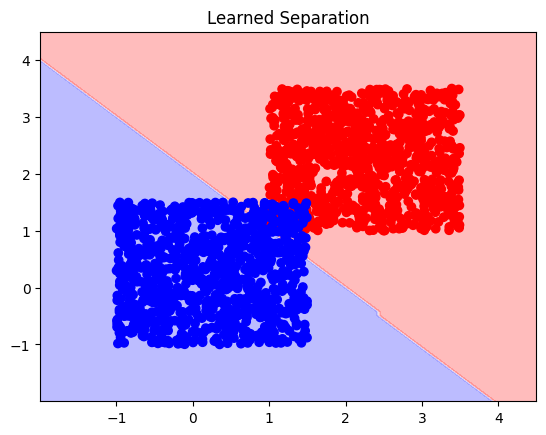

...

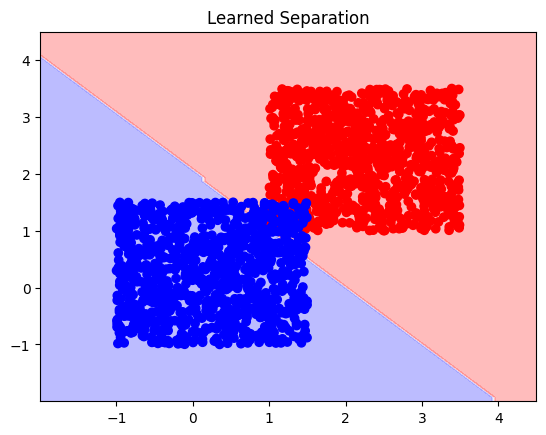

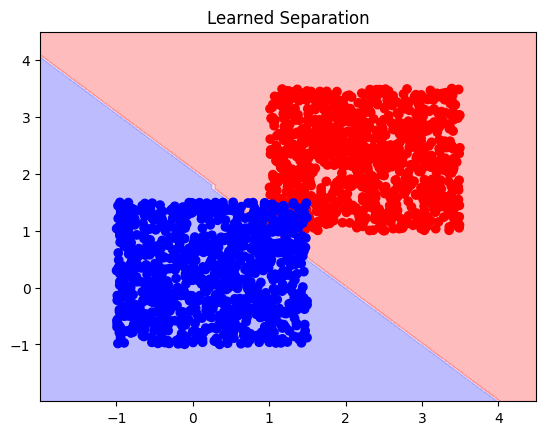

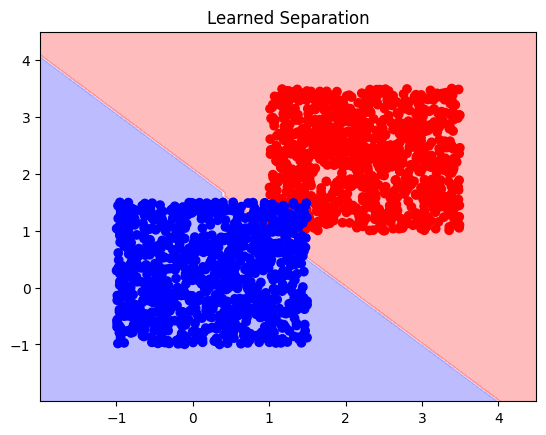

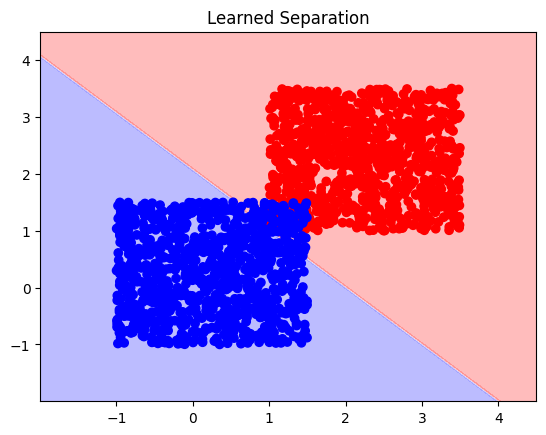

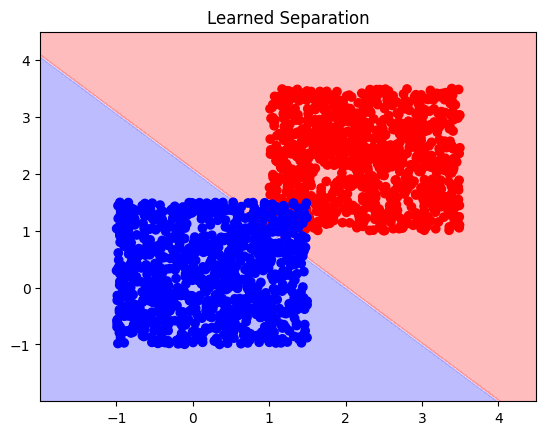

In [ ]:
%matplotlib inline
losses = []
epochs = 10000
learning_rate = 0.05
for epoch in range(epochs):
    # Predict
  Z1, A1, Z2, A2 = forwardPass(x, w1, b1, w2, b2)

    # Loss
  loss = lossFunction(y, A2)
  losses.append(loss)

    # Slopes
  dW1, db1, dW2, db2 = backward(x, y, Z1, A1, Z2, A2, w2)

    # Update
  w1 -= learning_rate * dW1
  b1 -= learning_rate * db1
  w2 -= learning_rate * dW2
  b2 -= learning_rate * db2


  if epoch % 100 == 0:
    print(f"Epoch {epoch}, Loss: {loss:.4f}")


plt.plot(losses)
plt.title("Loss Over Time")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()

In [ ]:
# Predict
_, _, _, A2 = forwardPass(x, w1, b1, w2, b2)
predictions = (A2 > 0.5).astype(int)  # >0.5 is red, else blue
accuracy = np.mean(predictions == y)
print(f"Accuracy: {accuracy:.4f}")

# Draw the decision line
x_min, x_max = x[:, 0].min() - 1, x[:, 0].max() + 1
y_min, y_max = x[:, 1].min() - 1, x[:, 1].max() + 1
xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
X_grid = np.c_[xx.ravel(), yy.ravel()]
_, _, _, A2_grid = forwardPass(X_grid, w1, b1, w2, b2)
Z = (A2_grid > 0.5).astype(int).reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.3, cmap='bwr')
plt.scatter(x[:, 0], x[:, 1], c=y.flatten(), cmap='bwr')
plt.title("Learned Separation")
plt.show()